In [1]:
import datetime
import sys, os
import matplotlib.pyplot as plt
import pandas as pd
import numpy as np

In [2]:
import scanpy as sc
sc.logging.print_memory_usage()
sc.settings.verbosity = 2
sc.settings.set_figure_params(dpi = 300, dpi_save = 300)
sc.logging.print_header()

from matplotlib.pyplot import rc_context

Memory usage: current 0.20 GB, difference +0.20 GB
scanpy==1.10.2 anndata==0.10.8 umap==0.5.5 numpy==1.26.4 scipy==1.13.0 pandas==2.0.3 scikit-learn==1.4.2 statsmodels==0.14.2 igraph==0.11.6 pynndescent==0.5.13


In [3]:
# add the utility functions folder to PATH
sys.path.append(os.path.abspath("../packages"))
from db_dev.helper import *

In [4]:
home_dir = os.path.expanduser("~")
current_directory = os.getcwd()

adata = sc.read_h5ad(current_directory+"/backups/facs1_norm_filtered_NOlog1p_hvg_z_pca_harmony_after_filtering_and_doublet_filtered_all_samples_50neighbors_0.15dist_25260x37733_250211_16h12.h5ad")


# Initial clustering

running Leiden clustering
    finished (0:00:01)


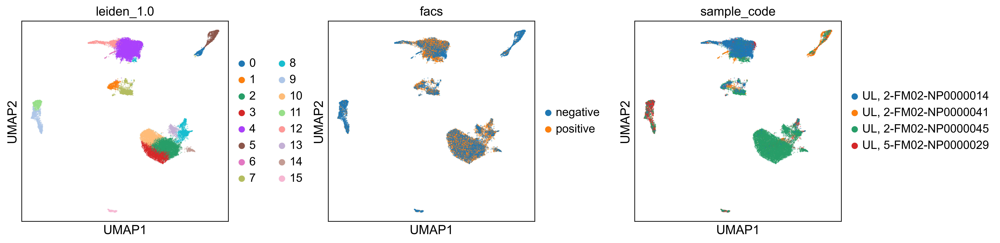

In [6]:
sc.tl.leiden(adata, flavor = "igraph", resolution = 1, key_added = "leiden_1.0", random_state = 0)
sc.pl.umap(adata, color = ["leiden_1.0", "facs", "sample_code"], 
           alpha = 0.5, 
           wspace = 0.35,
           ncols = 3,
           s = 5,
           save = "_leiden_1.0_all_samples_v1.png")
#  n_iterations = 2

running Leiden clustering
    finished (0:00:02)


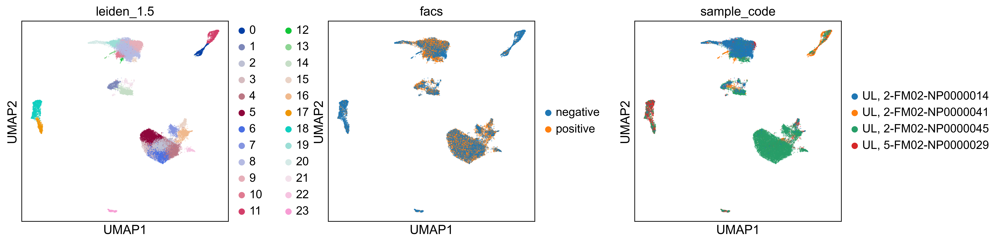

In [11]:
sc.tl.leiden(adata, flavor = "igraph", resolution = 1.5, key_added = "leiden_1.5", random_state = 0)
sc.pl.umap(adata, color = ["leiden_1.5", "facs", "sample_code"], 
           alpha = 0.5, 
           wspace = 0.35,
           ncols = 3,
           s = 5,
           save = "_leiden_1.5_all_samples_v1.png")
#  n_iterations = 2

running Leiden clustering
    finished (0:00:02)


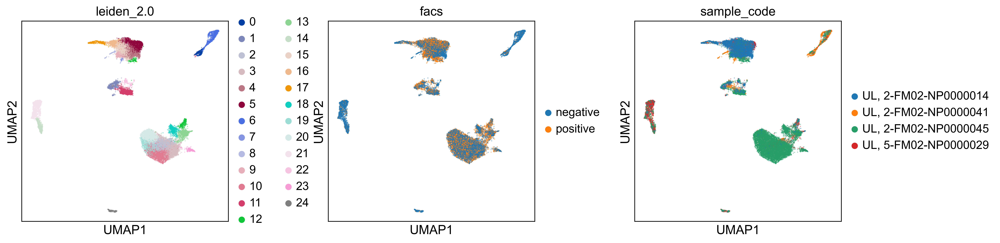

In [27]:
sc.tl.leiden(adata, flavor = "igraph", resolution = 2, key_added = "leiden_2.0", random_state = 0)
sc.pl.umap(adata, color = ["leiden_2.0", "facs", "sample_code"], 
           alpha = 0.5, 
           wspace = 0.35,
           ncols = 3,
           s = 5,
           save = "_leiden_2.0_all_samples_v1.png")
#  n_iterations = 2

running Leiden clustering
    finished (0:00:02)


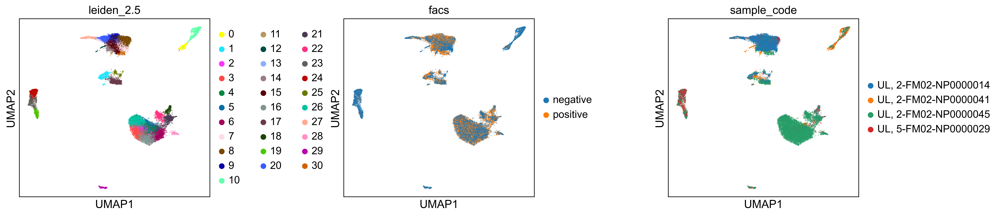

In [6]:
sc.tl.leiden(adata, flavor = "igraph", resolution = 2.5, key_added = "leiden_2.5", random_state = 0)
sc.pl.umap(adata, color = ["leiden_2.5", "facs", "sample_code"], 
           alpha = 0.5, 
           wspace = 0.55,
           ncols = 3,
           s = 5,
           save = "_leiden_2.5_all_samples_v1.png")
#  n_iterations = 2

# Subclustering

In [27]:

sc.tl.leiden(adata, 
             flavor = "igraph", 
             restrict_to=("leiden_2.5", ["27"]), 
             resolution = 0.5,
             key_added = "leiden_2.5_sub")


running Leiden clustering
    finished (0:00:00)


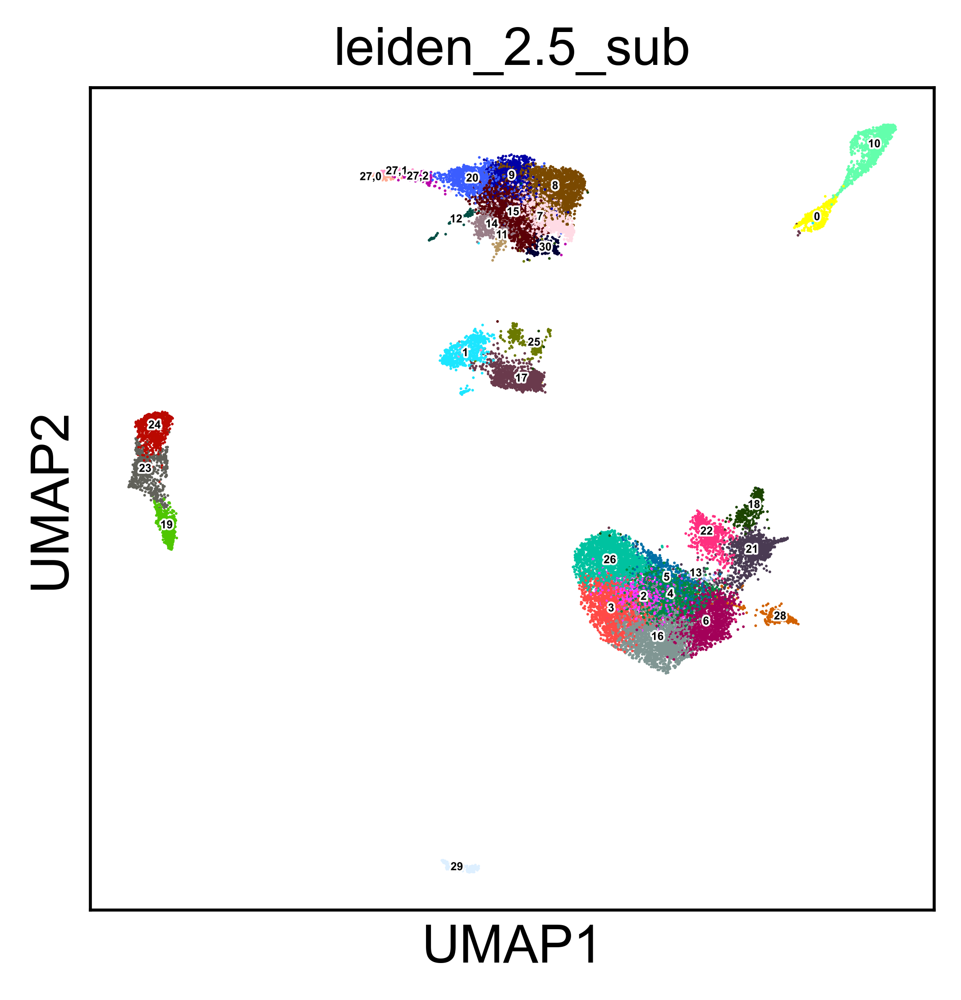

In [29]:
sc.pl.umap(adata, color = ["leiden_2.5_sub"], 
           alpha = 1, 
           wspace = 0.5,
           ncols = 3,
           s = 2, 
           legend_loc = "on data", 
           legend_fontsize = 3, legend_fontoutline = True,
           save = "_leiden_2.5_sub_all_samples_only_clean_v1.png")

In [30]:
# Saving obs dataframe

fname = 'backups/facs1_clustering_leiden_2.5_sub_all_samples_obs_%dx%d_%s'%(adata.obs.shape[0],adata.obs.shape[1],now())
print(fname)
save_df(adata.obs,fname)


backups/facs1_clustering_leiden_2.5_sub_all_samples_obs_25260x23_250217_20h27
